# Deep learning with MobileNetV2 for classifying skin diseases in dogs 

### Presented by
- Aryan Dutt
- Prince Raj
- Maria Camila Villamizar

CP 640 Machine Learning Faculty of Science   <br>
Brantford Campus  <br>

### Instructor 
Abbas Yazdinejadng  

## <font color=red>Preprocesing</font>

In [2]:
import os
import numpy as np
import cv2
from sklearn.model_selection import train_test_split

### Resizing images
Declaring the path, the default image size for all images and the lists to store images and labels.  
All images need to have the same size because pre-trained CNNs like MobileNetV2 are designed to accept images of fixed size. Feeding images of different sizes would break the input layer structure. Moreover, it helps mantaining uniformity in the number of operations required for convolution and pooling, leading to faster computations and better memory management. 

In [4]:
#Path to the main dataset folder
DATASET_PATH = "./Dataset"

#Image dimensions to resize
IMG_HEIGHT, IMG_WIDTH = 224, 224

#Lists to store images and labels
images = []
labels = []

Resizing, and saving images and labels. Considering that the labels are the name of the folder.

In [6]:
for label_folder in os.listdir(DATASET_PATH):
    
    label_path = os.path.join(DATASET_PATH, label_folder) #Label will be the name of the folder 
    
    if os.path.isdir(label_path):
        #For each image
        for image_file in os.listdir(label_path):
            
            #Build the full path to the image
            image_path = os.path.join(label_path, image_file)
            
            #Read and resize the image
            image = cv2.imread(image_path)                          
            if image is not None:                                   
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                image = cv2.resize(image, (IMG_WIDTH, IMG_HEIGHT))  
                images.append(image)                                
                labels.append(label_folder)                         

### Normalizing pixel values
Normalize pixels will help the model to converge faster by scaling the pixel values to a smaller range (0 to 1), preventing large gradients and ensuring that all input features (pixels) are trated equally, avoiding dominance by larger pixel values. Moreover, MobileNetV2 is trained with normalized data, which ensures consistency and better feature utilization.  
We convert lists to numPy arrays because they are optimized for numerical operations, making faster computations and it is more memory efficient than lists. 

In [8]:
#Converting lists to NumPy arrays
images = np.array(images, dtype="float32")
labels = np.array(labels)

#Normalizing pixel values (scale to [0, 1])
images = images / 255.0

### Splitting training and test sets

In [10]:
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42)

print("Training set shape:", X_train.shape, y_train.shape)
print("Testing set shape:", X_test.shape, y_test.shape)

Training set shape: (98, 224, 224, 3) (98,)
Testing set shape: (25, 224, 224, 3) (25,)


Checking training and test sets

In [12]:
from collections import Counter

In [13]:
print(f"Number of images in the training set: {len(X_train)}")
print(f"Number of images in the testing set: {len(X_test)}")

#Checking the distribution of labels in both sets
print("Label distribution in the training set:")
print(Counter(y_train))

print("Label distribution in the testing set:")
print(Counter(y_test))


Number of images in the training set: 98
Number of images in the testing set: 25
Label distribution in the training set:
Counter({'Parasites': 25, 'Infections': 20, 'Allergies': 20, 'Autoimmune': 18, 'Healthy': 15})
Label distribution in the testing set:
Counter({'Allergies': 6, 'Autoimmune': 6, 'Infections': 5, 'Healthy': 5, 'Parasites': 3})


### Saving Training and test sets in a different directory

In [15]:
import shutil

In [16]:
#Paths where we will store the images 
output_dir = "./ModelData"
training_dir = os.path.join(output_dir, "Training")
testing_dir = os.path.join(output_dir, "Testing")

#Removing directories if they already exist
if os.path.exists(training_dir):
    shutil.rmtree(training_dir)  #Removing the training directory
if os.path.exists(testing_dir):
    shutil.rmtree(testing_dir)  #Removing the testing directory
    
#Creating the directories 
os.makedirs(training_dir, exist_ok=True)
os.makedirs(testing_dir, exist_ok=True)

In [17]:
# Moving training and testing data into their respective folders
for label in set(y_train):
    os.makedirs(os.path.join(training_dir, label), exist_ok=True)
    os.makedirs(os.path.join(testing_dir, label), exist_ok=True)

# Copying training images
for img, label in zip(X_train, y_train):
    img_path = os.path.join(training_dir, label, f"{hash(img.tobytes())}.jpg")
    img_bgr = cv2.cvtColor((img * 255).astype("uint8"), cv2.COLOR_RGB2BGR)  # Convert to BGR before saving
    cv2.imwrite(img_path, img_bgr)

# Copying testing images
for img, label in zip(X_test, y_test):
    img_path = os.path.join(testing_dir, label, f"{hash(img.tobytes())}.jpg")
    img_bgr = cv2.cvtColor((img * 255).astype("uint8"), cv2.COLOR_RGB2BGR)  # Convert to BGR before saving
    cv2.imwrite(img_path, img_bgr)


Previsualizing images

In [19]:
import matplotlib.pyplot as plt
from collections import defaultdict

In [20]:
# Function to preview images
def preview_images_per_class(folder_path, images_per_class=2):
    plt.figure(figsize=(10, 10))
    class_counts = defaultdict(int)
    total_images = 0
    
    for label_folder in os.listdir(folder_path):
        label_path = os.path.join(folder_path, label_folder)
        if os.path.isdir(label_path):
            for image_file in os.listdir(label_path):
                if image_file.lower().endswith((".png", ".jpg", ".jpeg")):  # Accept multiple formats
                    if class_counts[label_folder] < images_per_class:  # Limit per class
                        img_path = os.path.join(label_path, image_file)
                        img = cv2.imread(img_path)  # Load image
                        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for visualization
                        plt.subplot(len(os.listdir(folder_path)), images_per_class, total_images + 1)
                        plt.imshow(img)
                        plt.title(label_folder)
                        plt.axis('off')
                        class_counts[label_folder] += 1
                        total_images += 1
                    if class_counts[label_folder] >= images_per_class:
                        break
    plt.tight_layout()
    plt.show()

Training Set:


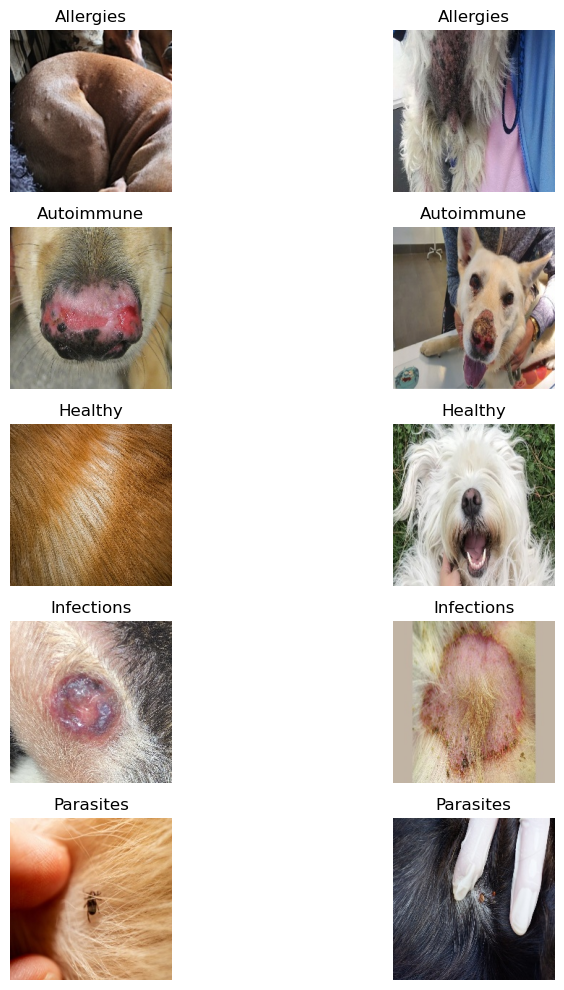

In [21]:
# Preview training set
print("Training Set:")
preview_images_per_class(training_dir, images_per_class=2)

Testing Set:


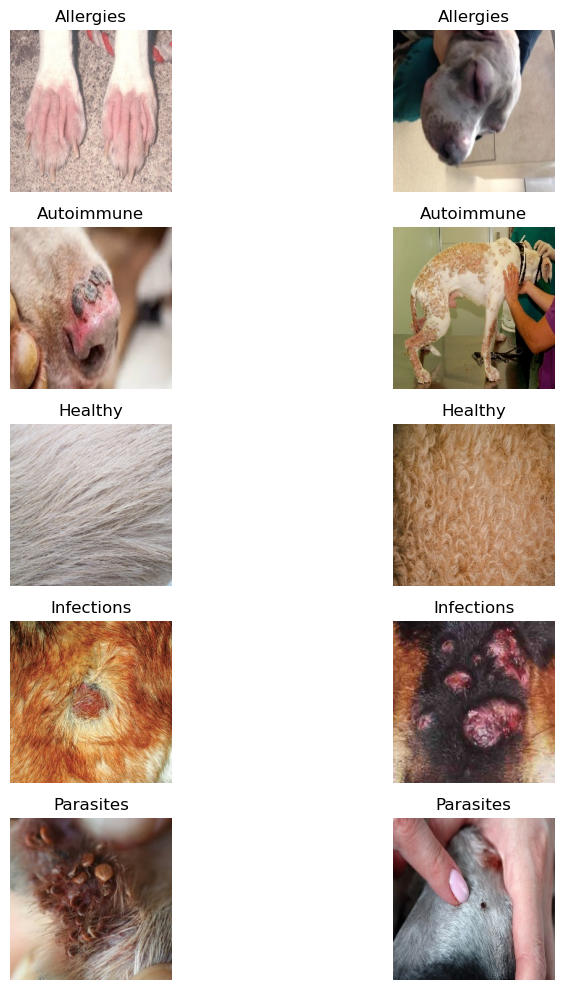

In [22]:
# Preview testing set
print("Testing Set:")
preview_images_per_class(testing_dir, images_per_class=2)

###  Data Augmentation for Training set
It artificially increases the size and diversity of the dataset. This helps the model generalize better by exposing it to varied versions of the same image, reducing overfitting and improving performance on unseen data. This could be done by:
- rotating
- shifting (horizontally and vertically)
- shearing
- zooming
- Flipping

And the fill modes represnets how to fill empty pixels, in this case nearest uses the nearest pixel value to fill the gaps

In [24]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [25]:
#Augmentation
augmentation = ImageDataGenerator(
    rotation_range=20,           
    width_shift_range=0.2,       
    height_shift_range=0.2,      
    shear_range=0.2,             
    zoom_range=0.2,              
    horizontal_flip=True,        
    fill_mode='nearest'          
)


In [26]:
# Applying the augmentation
for label_folder in os.listdir(training_dir):
    
    label_path = os.path.join(training_dir, label_folder)
    
    if os.path.isdir(label_path): 
        
        for image_file in os.listdir(label_path):
            
            if image_file.lower().endswith((".png", ".jpg", ".jpeg")): 
                img_path = os.path.join(label_path, image_file)
                
                #Converting BGR to RGB
                img = cv2.imread(img_path)
                if img is not None:  # Ensuring the image is valid
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  #Converting to RGB
                    
                    #Ensuring the pixel values are in the correct range
                    img = img.astype('float32') 
                    
                    img = img.reshape((1,) + img.shape)  # Reshape 
                    
                    #Saving augmented images
                    count = 0
                    for batch in augmentation.flow(img, batch_size=1, save_to_dir=label_path, save_prefix='aug', save_format='jpg'):
                        count += 1
                        if count >= 2:  #Number of augmented images per original image
                            break


Getting the training images and labels

In [28]:
import numpy as np

In [29]:
#Path to the training folder
training_dir = "./ModelData/Training"

# Lists to store images and labels
X_train = []
y_train = []

In [30]:
#Loading all images from the training folder
for label_folder in os.listdir(training_dir):
    label_path = os.path.join(training_dir, label_folder)
    if os.path.isdir(label_path): 
        for image_file in os.listdir(label_path):
            if image_file.lower().endswith((".png", ".jpg", ".jpeg")): 
                img_path = os.path.join(label_path, image_file)
                
                #Load image
                img = cv2.imread(img_path)
                if img is not None:                             # Ensure the image is valid
                    img = cv2.resize(img, (224, 224))           # Resize to 224x224
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB
                    X_train.append(img)
                    y_train.append(label_folder)                # Using folder name as the label

In [31]:
#Converting to NumPy arrays
X_train = np.array(X_train).astype('float32')  # Convert to float32
y_train = np.array(y_train)

#Normalizing pixel values to [0, 1]
X_train /= 255.0

In [32]:
#Checking the shapes and types
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_train dtype: {y_train.dtype}")

X_train shape: (291, 224, 224, 3)
y_train shape: (291,)
y_train dtype: <U10


### Converting labels to int format
CNN works with numerical data, it can't directly process string labels

In [34]:
from sklearn.preprocessing import LabelEncoder

In [35]:
#Converting string labels in the training set to integers
label_encoder = LabelEncoder()
y_train = label_encoder.fit_transform(y_train)

#Applying the same transformation to the test set
y_test = label_encoder.transform(y_test)

#Verifying consistency
print("Mapping of classes to integers:")
for class_name, label in zip(label_encoder.classes_, range(len(label_encoder.classes_))):
    print(f"{class_name}: {label}")

#Checking transformed test labels
print(f"y_test dtype after transformation: {y_test.dtype}")  # Should be int
print(f"y_test values: {y_test[:10]}")  # Show a few test labels

Mapping of classes to integers:
Allergies: 0
Autoimmune: 1
Healthy: 2
Infections: 3
Parasites: 4
y_test dtype after transformation: int32
y_test values: [0 1 1 3 0 1 2 4 1 2]


## <font color=red>Visualization of preprocessing images</font>

In [36]:
import os

print("Training Set:")
for label_folder in os.listdir(training_dir):
    label_path = os.path.join(training_dir, label_folder)
    print(f"{label_folder}: {len(os.listdir(label_path))} images")

print("\nTesting Set:")
for label_folder in os.listdir(testing_dir):
    label_path = os.path.join(testing_dir, label_folder)
    print(f"{label_folder}: {len(os.listdir(label_path))} images")


Training Set:
Allergies: 60 images
Autoimmune: 54 images
Healthy: 45 images
Infections: 60 images
Parasites: 72 images

Testing Set:
Allergies: 6 images
Autoimmune: 6 images
Healthy: 5 images
Infections: 5 images
Parasites: 3 images


Training Set:
Class: Allergies (60 images)


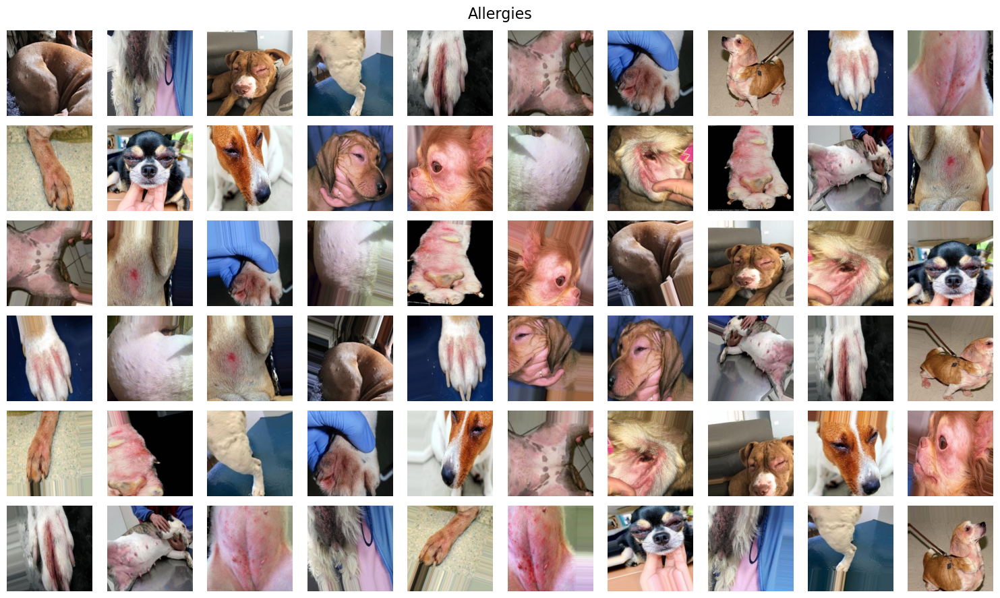

Class: Autoimmune (54 images)


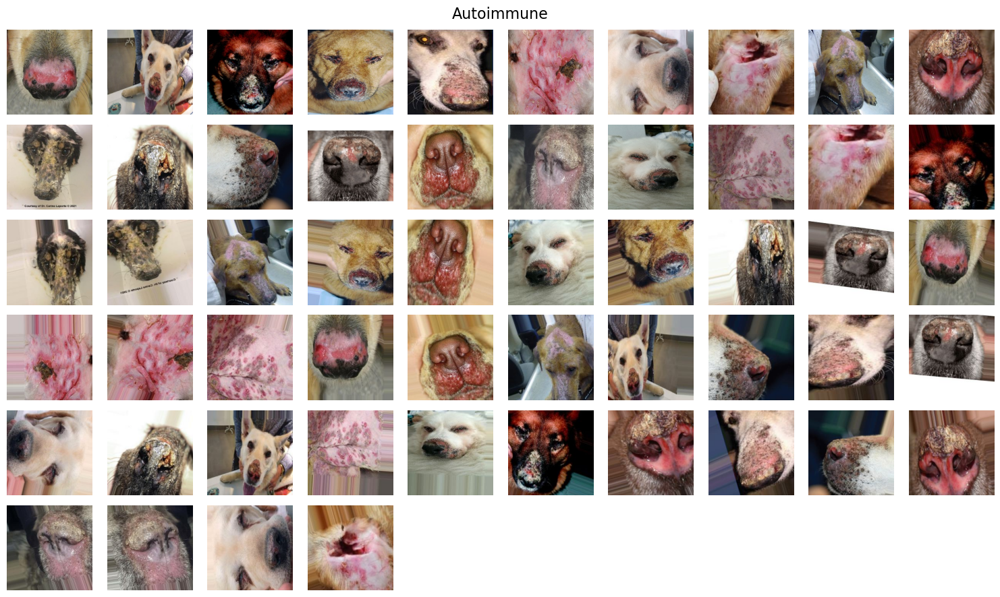

Class: Healthy (45 images)


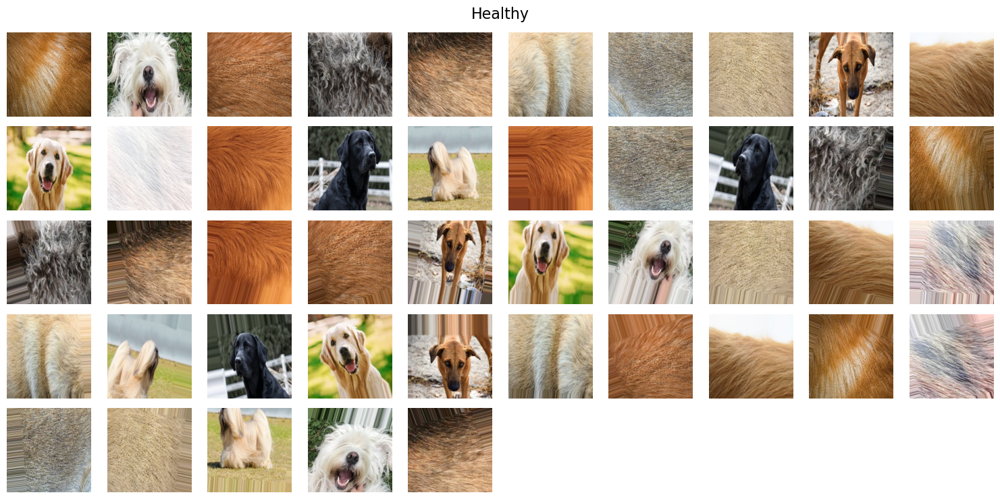

Class: Infections (60 images)


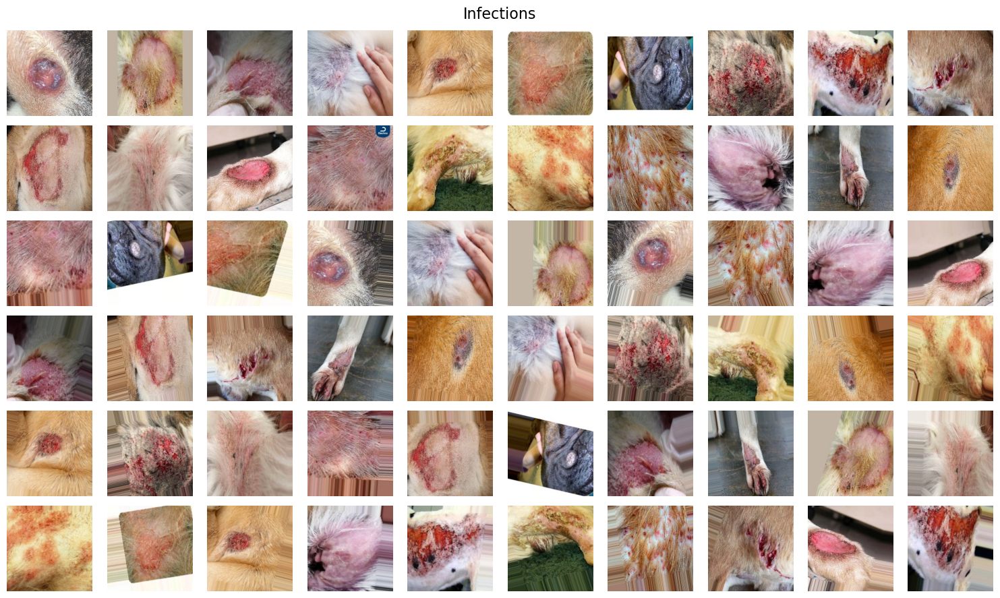

Class: Parasites (72 images)


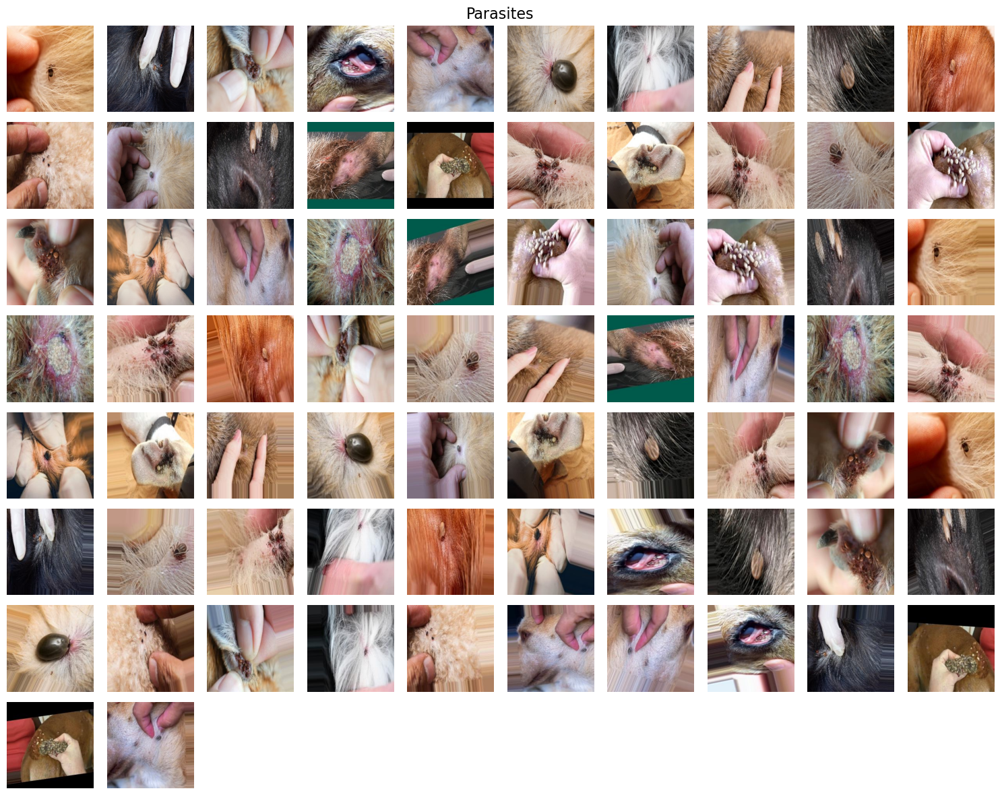

Testing Set:
Class: Allergies (6 images)


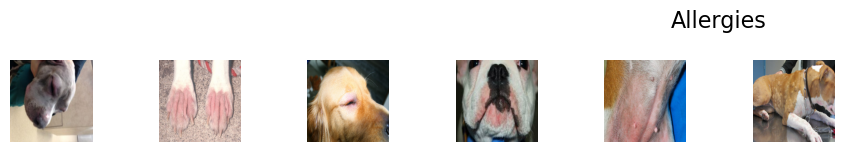

Class: Autoimmune (6 images)


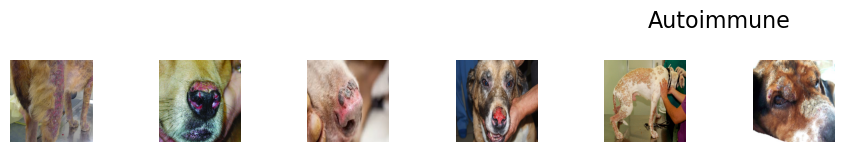

Class: Healthy (5 images)


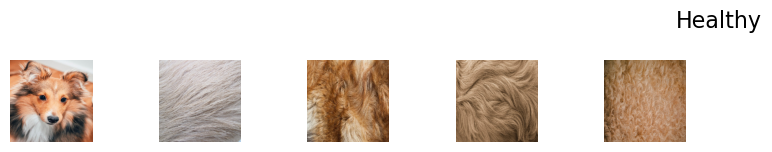

Class: Infections (5 images)


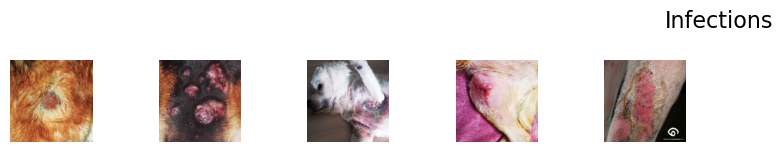

Class: Parasites (3 images)


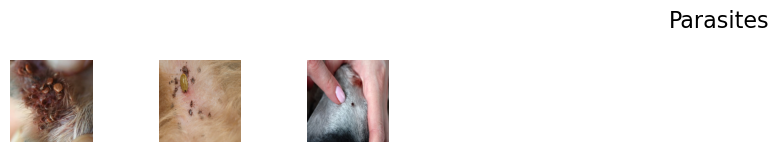

Training class distribution: Counter({4: 72, 0: 60, 3: 60, 1: 54, 2: 45})
Testing class distribution: Counter({0: 6, 1: 6, 3: 5, 2: 5, 4: 3})


In [37]:
import matplotlib.pyplot as plt
import numpy as np

def display_images_by_class_grid(images, labels, label_encoder, dataset_type="Training"):

    class_labels = label_encoder.classes_  #Retrieve the class names
    num_classes = len(class_labels)
    
    print(f"{dataset_type} Set:")
    for class_idx, class_name in enumerate(class_labels):
        # Get images and labels for the current class
        class_images = images[np.where(labels == class_idx)]  #Filter images for the current class
        
        if len(class_images) == 0:
            print(f"No images found for class {class_name}")
            continue
        
        # Set up grid for displaying images
        num_images = len(class_images)
        grid_cols = 10  # Number of columns in the grid
        grid_rows = (num_images // grid_cols) + (1 if num_images % grid_cols != 0 else 0)  #Compute rows
        
        print(f"Class: {class_name} ({num_images} images)")
        plt.figure(figsize=(grid_cols * 1.5, grid_rows * 1.5))  #Adjust figure size
        
        for i, img in enumerate(class_images):
            plt.subplot(grid_rows, grid_cols, i + 1)
            plt.imshow(img)
            plt.axis("off")
            plt.title("")
        
        plt.suptitle(class_name, fontsize=16)
        plt.tight_layout()
        plt.show()

y_train = np.array(y_train)
y_test = np.array(y_test)

#Displaying training set 
display_images_by_class_grid(X_train, y_train, label_encoder, dataset_type="Training")

#Displaying testing set 
display_images_by_class_grid(X_test, y_test, label_encoder, dataset_type="Testing")

print("Training class distribution:", Counter(y_train))
print("Testing class distribution:", Counter(y_test))


## <font color=red>Model Selection</font>

### Training MobileNetV2 model
CNNs can automatically learn features like edges, patterns, and textures from images without needing us to manually extract them. Unlike other models like SVM or KNN they require more preprocessing, such as manual feature extraction, and are not as effective at handling high-dimensional image data, especially for complex problems like this one.  
We chose MobileNetV2 which is a pre-trained CNN designed for transfer learning (The model was already trained on a large dataset called ImageNet and has learned general image features, making it easier to adapt to dogs skin disease detection.

In [39]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.metrics import AUC
from sklearn.utils import resample
import numpy as np
import shutil
from tensorflow.keras.utils import to_categorical

Initializations

In [41]:
#Converting labels to one-hot encoding
y_train_one_hot = to_categorical(y_train, num_classes=len(set(y_train)))
y_test_one_hot = to_categorical(y_test, num_classes=len(set(y_train)))

#Loading MobileNetV2 base model
base_model = MobileNetV2(input_shape=(224, 224, 3),
                         include_top=False,  # Exclude the top layer
                         weights='imagenet')

#Freezing base layers initially
base_model.trainable = False

#Building the complete model with custom layers
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),  # Dimensionality reduction
    layers.Dense(256, activation='relu'),  # Intermediate dense layer
    layers.Dropout(0.5),  # Dropout to prevent overfitting
    layers.Dense(len(set(y_train)), activation='softmax')  # Output layer for classification
])

#Compiling the model
model.compile(optimizer=Adam(learning_rate=0.001),
              loss="categorical_crossentropy",  # Use categorical crossentropy
              metrics=["accuracy", AUC(name="auc")])  # Include AUC as a metric

#Early Stopping to avoid overfitting
early_stopping = EarlyStopping(monitor='val_auc', patience=5, mode='max', restore_best_weights=True)

#Variables to store results
accuracies = []
auc_scores = []
best_val_auc = float("-inf")
best_model_path = "best_model.keras"

## <font color=red>Model Evaluation</font>
### Bootstraping Resampling
We used bootstrap resampling instead Cross-Validation becasue of the small size of our dataset. Cross-validation divides the dataset into multiple folds, which can reduce the data available for training in each fold, which can result less effective with limited data having higher variance between folds.  
Bootstrap resampling creates multiple training datasets by randomly sampling with remplacement, which allows the model to see some data points multiple times while leaving others as part of the out of bag validation set. This technique ensures that the model is trained on a laeger variety of samples, being usefull for our small dataset. Moreover it uses multiple iterations to estimate the better estimate model performance by averaging results by each one, making it more robust. 

### Early Stopping

We also use early stopping to prevent overfitting by monitoring the validation AUC, the training will stop when the model's performance on the validation set stops improving for a defined number of epochs or patience (5 in this case)

In [43]:
n_iterations = 5  # Number of bootstrap iterations
for iteration in range(n_iterations):
    print(f"\nBootstrap Iteration {iteration + 1}...")

    #Rresampling
    X_train_bootstrap, y_train_bootstrap = resample(X_train, y_train_one_hot, random_state=iteration)
    X_val_bootstrap, y_val_bootstrap = X_train, y_train_one_hot  # Out-of-bag samples act as validation set

    #Saving the best model for this bootstrap iteration
    checkpoint = ModelCheckpoint(f"best_model_iteration_{iteration + 1}.keras", save_best_only=True, monitor="val_auc", mode="max")

    #Training the model
    history = model.fit(
        X_train_bootstrap, y_train_bootstrap,
        validation_data=(X_val_bootstrap, y_val_bootstrap),
        epochs=20,
        batch_size=32,
        callbacks=[early_stopping, checkpoint],
        verbose=1
    )

    #Evaluating the model on the validation set
    eval_result = model.evaluate(X_val_bootstrap, y_val_bootstrap, verbose=0)
    accuracies.append(eval_result[1])  # Save accuracy for this iteration
    auc_scores.append(eval_result[2])  # Save AUC for this iteration

    #Updating the global best model
    if max(history.history["val_auc"]) > best_val_auc:
        best_val_auc = max(history.history["val_auc"])
        shutil.copy(f"best_model_iteration_{iteration + 1}.keras", best_model_path)

    print(f"Iteration {iteration + 1} - Accuracy: {eval_result[1]}, Val AUC: {max(history.history['val_auc'])}")

print(f"\nBootstrap Accuracy: {np.mean(accuracies)} ± {np.std(accuracies)}")
print(f"Bootstrap AUC: {np.mean(auc_scores)} ± {np.std(auc_scores)}")
print(f"Best model saved as '{best_model_path}'.")


Bootstrap Iteration 1...
Epoch 1/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - accuracy: 0.3474 - auc: 0.6688 - loss: 1.7442 - val_accuracy: 0.7938 - val_auc: 0.9542 - val_loss: 0.6286
Epoch 2/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 8s 823ms/step - accuracy: 0.7742 - auc: 0.9481 - loss: 0.6214 - val_accuracy: 0.8763 - val_auc: 0.9883 - val_loss: 0.3535
Epoch 3/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 925ms/step - accuracy: 0.9207 - auc: 0.9904 - loss: 0.2938 - val_accuracy: 0.9210 - val_auc: 0.9938 - val_loss: 0.2572
Epoch 4/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 9s 754ms/step - accuracy: 0.9618 - auc: 0.9983 - loss: 0.1533 - val_accuracy: 0.9347 - val_auc: 0.9953 - val_loss: 0.2176
Epoch 5/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 832ms/step - accuracy: 0.9926 - auc: 0.9998 - loss: 0.0979 - val_accuracy: 0.9519 - val_auc: 0.9979 - val_loss: 0.1540
Epoch 6/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 10s 818ms/step - accuracy: 0.9934 - auc: 0.9999 - loss: 0.0677 - val_accuracy: 0.9553 - val_auc: 0.9983 - val_loss: 0.1322
Epoch 7/20
10

### Fine tuning
We used fine tuning to improve the model's ability to learn features specific to skin diseases in dogs. Initially the base layers of MobileNetV2 were frozen to retain the general image features it had learned during pretraining on a large dataset. After training the final layers we unfroze the base layers and fine-tuned the entire model with a lower learning rate, which allows the model to adjust the pre trained weights slightly, ensuring it could better adapt to our specific dataset without overfitting. 

In [45]:
# Fine-Tuning: Unfreezing the base layers of the model
print("\nStarting Fine-Tuning...")
base_model.trainable = True  #Making the base layers trainable

#Recompiling the model with a lower learning rate
model.compile(optimizer=Adam(learning_rate=1e-5),  #Fine-tuning with a smaller learning rate
              loss="categorical_crossentropy",  
              metrics=["accuracy", AUC(name="auc")])

#Fine-tuning on the entire training dataset
fine_tuning_checkpoint = ModelCheckpoint(f"{best_model_path.split('.')[0]}_tunned.keras", save_best_only=True, monitor="val_auc", mode="max")
fine_tune_history = model.fit(
    X_train, y_train_one_hot, 
    validation_data=(X_test, y_test_one_hot),  
    epochs=10,
    batch_size=32,
    callbacks=[
        EarlyStopping(monitor="val_auc", patience=3, mode="max", restore_best_weights=True),
        fine_tuning_checkpoint
    ],
    verbose=1
)

print(f"\nFine-Tuning completed. Fine-tuned model saved as '{best_model_path.split('.')[0]}_tunned.keras'.")


Starting Fine-Tuning...
Epoch 1/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 100s 2s/step - accuracy: 0.6404 - auc: 0.8541 - loss: 1.3382 - val_accuracy: 0.8000 - val_auc: 0.9144 - val_loss: 1.1338
Epoch 2/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - accuracy: 0.6910 - auc: 0.8938 - loss: 1.0053 - val_accuracy: 0.8000 - val_auc: 0.9154 - val_loss: 1.1246
Epoch 3/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.7139 - auc: 0.9166 - loss: 0.8564 - val_accuracy: 0.8000 - val_auc: 0.9150 - val_loss: 1.1144
Epoch 4/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - accuracy: 0.7799 - auc: 0.9366 - loss: 0.7340 - val_accuracy: 0.8000 - val_auc: 0.9166 - val_loss: 1.1016
Epoch 5/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 26s 2s/step - accuracy: 0.7740 - auc: 0.9435 - loss: 0.6650 - val_accuracy: 0.8000 - val_auc: 0.9170 - val_loss: 1.0944
Epoch 6/10
10/10 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.8450 - auc: 0.9643 - loss: 0.5043 - val_accuracy: 0.7600 - val_auc: 0.9152 - val_loss: 1.0926
Epoch 7/10
10/10 ━━━━━━━━━

## <font color=red>Model Performance and results</font>

In [47]:
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.models import load_model
import seaborn as sns

#### Loading the best model

In [83]:
#Loading the best model
model = load_model("best_model_tunned.keras")
#Predicting on the test set
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


### Performance Metrics
The model achieved an overall accuracy of 80%, with strong performance in detecting parasites (precision, recall, and F1-score of 1.00) and infections (F1-score of 0.89). However, it showed slightly lower recall for healthy (0.60) and moderate results for autoimmune and allergies. The macro average F1-score was 0.82, indicating balanced performance across most categories, and the general accuracy is 80% which means that the model correctly classify 80% of the total instances, what is a good result considering the size of the dataset. 

In [85]:
print("Classification Report:")
print(classification_report(y_test, y_pred_classes, target_names=label_encoder.classes_))

Classification Report:
              precision    recall  f1-score   support

   Allergies       0.71      0.83      0.77         6
  Autoimmune       0.62      0.83      0.71         6
     Healthy       1.00      0.60      0.75         5
  Infections       1.00      0.80      0.89         5
   Parasites       1.00      1.00      1.00         3

    accuracy                           0.80        25
   macro avg       0.87      0.81      0.82        25
weighted avg       0.84      0.80      0.80        25



### Confusion Matrix
The confusion matrix shows that the model performs well on most classes but classes such as allergies and autoimmune might share overlapping visual patterns in the dataset, making it harder for the model to differentiate between them. This is reflected in the confusion matrix, where the model misclassifies healthy as allergies or autoimmune. Other classes like infections and parasites are predicted with high accuracy, as there are no misclassifications for parasites and only one for infections. Those are very good results considering the size of the dataset. 

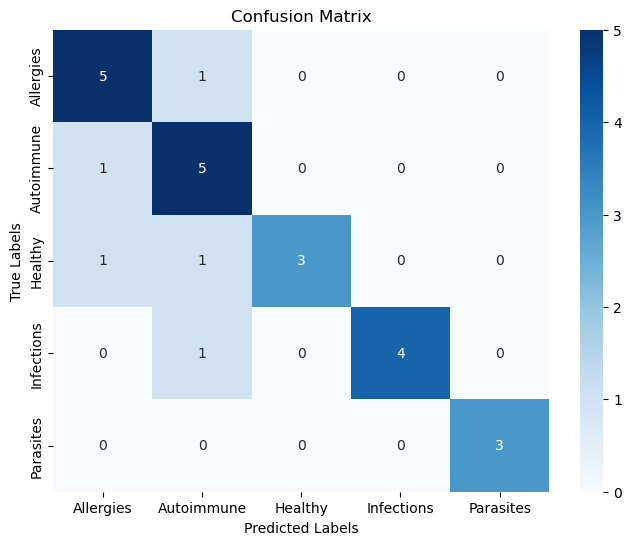

In [87]:
conf_matrix = confusion_matrix(y_test, y_pred_classes)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

### ROC and AUC
An AUC score of 92.7% indicates that the model is effective at distinguishing between classes. 

AUC Score: 0.9274035087719298


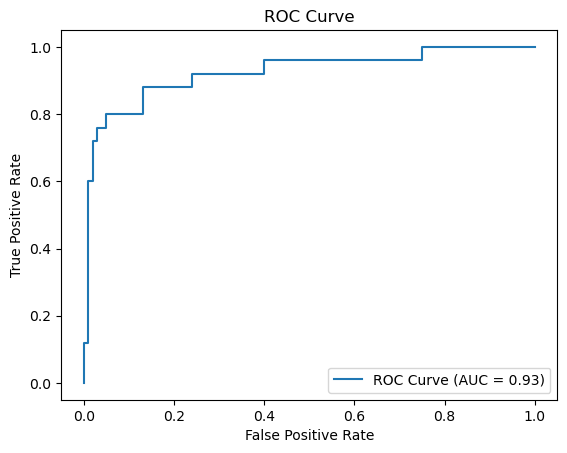

In [89]:
y_test_binary = label_binarize(y_test, classes=np.unique(y_test)) 
auc_score = roc_auc_score(y_test_binary, y_pred, multi_class="ovr")
print("AUC Score:", auc_score)

#Plotting ROC Curve
fpr, tpr, _ = roc_curve(y_test_binary.ravel(), y_pred.ravel())
plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {auc_score:.2f})")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

This graphs shows that some classes like autoimmune and allergies are harder to predict, likely due to overlapping features with other classes. 

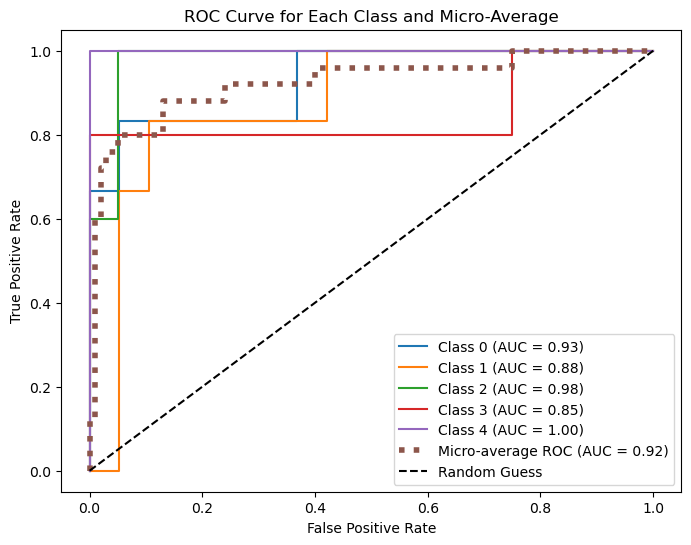

In [101]:
#Binarizing the labels for multi-class ROC
y_test_binary = label_binarize(y_test, classes=np.unique(y_test)) 
n_classes = y_test_binary.shape[1]

fpr = {}
tpr = {}
roc_auc = {}

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binary[:, i], y_pred[:, i])  #ROC for each class
    roc_auc[i] = auc(fpr[i], tpr[i])  #AUC for each class

#Computing micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(y_test_binary.ravel(), y_pred.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

#Plotting ROC curves for each class and the micro-average
plt.figure(figsize=(8, 6))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")  #Per-class ROC

#Plotting micro-average ROC curve
plt.plot(fpr["micro"], tpr["micro"],
         label=f"Micro-average ROC (AUC = {roc_auc['micro']:.2f})",
         linestyle=':', linewidth=4)

plt.plot([0, 1], [0, 1], "k--", label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve for Each Class and Micro-Average")
plt.legend(loc="lower right")
plt.show()


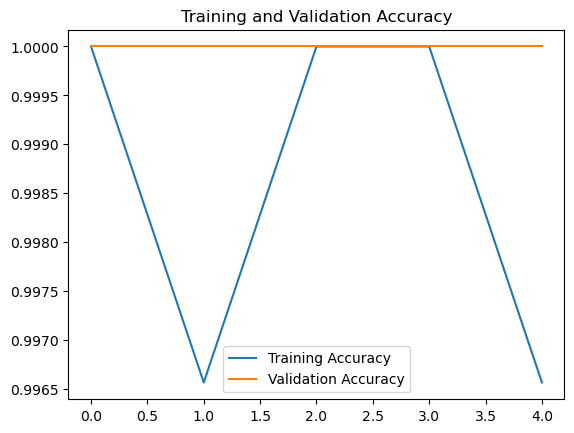

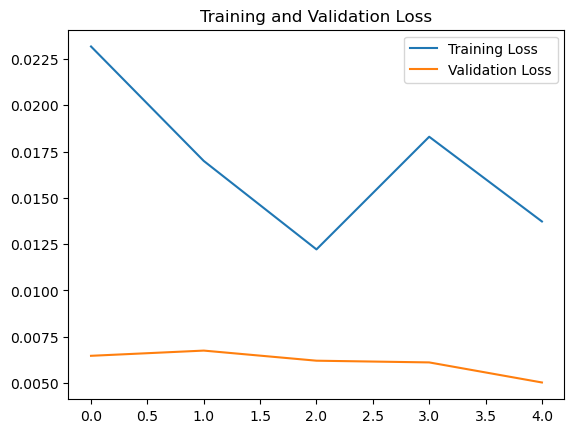

In [97]:
# Training and validation accuracy/loss curves
plt.figure()
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title("Training and Validation Accuracy")
plt.legend()
plt.show()

plt.figure()
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title("Training and Validation Loss")
plt.legend()
plt.show()